In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [2]:
import os
import sys 
import pandas as pd 
import datetime

In [3]:
# 필요한 패키지와 라이브러리를 가져옴
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

# 그래프에서 마이너스 폰트 깨지는 문제에 대한 대처
mpl.rcParams['axes.unicode_minus'] = False
%matplotlib inline

In [4]:
plt.rcParams["font.family"] = 'NanumSquare'
plt.rcParams["font.size"] = 13
plt.rcParams["figure.figsize"] = (14,4)

In [5]:
import warnings
warnings.filterwarnings(action='ignore')

In [6]:
# !pip install cufflinks
import plotly
import cufflinks as cf
cf.go_offline(connected=True)

In [7]:
pd.set_option('display.float_format', lambda x: '%.2f' % x)

In [8]:
file_list = os.listdir('./KT_data')
file_list

['adstrd_master.csv',
 'card.csv',
 'Case.csv',
 'COVID_19',
 'COVID_eng_kor_table.xlsx',
 'Data-Science-for-COVID-19',
 'delivery.csv',
 'fpopl.csv',
 'index.csv',
 'PatientInfo.csv',
 'Policy.csv',
 'Region.csv',
 'Time.csv',
 'TimeAge.csv',
 'TimeGender.csv',
 'TimeProvince.csv']

In [9]:
direc = "./KT_data/"

In [8]:
deli = pd.read_csv(direc + "delivery.csv", dtype = 'object') # 행정동 유동인구
deli.head() 
# 순번, 처리일시, 배달요청업체, 상태, 배달접수회사, 배달상점, 업종, 상점 주소 법정동코드 
# DSTN 매달목적지 

,SERIAL_NUMBER,PROCESS_DT,DLVR_RQESTER_ID,DLVR_REQUST_STTUS_VALUE,DLVR_RCEPT_CMPNY_ID,DLVR_STORE_ID,DLVR_STORE_INDUTY_NM,DLVR_STORE_LEGALDONG_CODE,DLVR_STORE_SIDO,DLVR_STORE_SIGUNGU,...,DLVR_MAN_ID,DLVR_AMOUNT,CALL_RLAY_FEE_AMOUNT,GOODS_AMOUNT,SETLE_KND_VALUE,SETLE_CARD_CN,DLVR_RCEPT_TIME,DLVR_CARALC_TIME,DLVR_COMPT_TIME,DLVR_CANCL_TIME
0,4577985,2020-01-01,C000035,1,C000035,S0032342,치킨,4812710600,경상남도,창원시 마산회원구,...,D0005271,4290,300,25000,1,승인:비씨카드사,2020-01-01 00:15:49,2020-01-01 00:21:38,2020-01-01 00:41:37,NaN
1,4577986,2020-01-01,C000237,1,C000237,S0021847,찜탕,4121010200,경기도,광명시,...,D0003269,4800,200,49000,2,NaN,2020-01-01 01:12:14,2020-01-01 01:21:41,2020-01-01 01:31:44,NaN
2,4577988,2020-01-01,C000129,1,C000129,S0025740,치킨,1138010400,서울특별시,은평구,...,D0001536,3300,300,23000,3,승인:,2020-01-01 00:01:14,2020-01-01 00:01:47,2020-01-01 00:18:47,NaN
3,4577989,2020-01-01,C000029,1,C000043,S0039634,한식,4115010100,경기도,의정부시,...,D0005061,4500,300,20000,2,NaN,2020-01-01 01:01:34,2020-01-01 01:28:06,2020-01-01 01:36:48,NaN
4,4577991,2020-01-01,C000130,1,C000130,S0002237,한식,4128112800,경기도,고양시 덕양구,...,D0005215,6500,300,32000,2,NaN,2020-01-01 01:05:06,2020-01-01 01:08:01,2020-01-01 01:29:00,NaN


In [9]:
deli.shape

(5158324, 31)

In [10]:
deli.dtypes

SERIAL_NUMBER                object
PROCESS_DT                   object
DLVR_RQESTER_ID              object
DLVR_REQUST_STTUS_VALUE      object
DLVR_RCEPT_CMPNY_ID          object
DLVR_STORE_ID                object
DLVR_STORE_INDUTY_NM         object
DLVR_STORE_LEGALDONG_CODE    object
DLVR_STORE_SIDO              object
DLVR_STORE_SIGUNGU           object
DLVR_STORE_DONG              object
DLVR_STORE_RI                object
DLVR_STORE_ADSTRD_CODE       object
DLVR_STORE_RDNMADR_CODE      object
DLVR_DSTN_LEGALDONG_CODE     object
DLVR_DSTN_SIDO               object
DLVR_DSTN_SIGUNGU            object
DLVR_DSTN_DONG               object
DLVR_DSTN_RI                 object
DLVR_DSTN_ADSTRD_CODE        object
DLVR_DSTN_RDNMADR_CODE       object
DLVR_MAN_ID                  object
DLVR_AMOUNT                  object
CALL_RLAY_FEE_AMOUNT         object
GOODS_AMOUNT                 object
SETLE_KND_VALUE              object
SETLE_CARD_CN                object
DLVR_RCEPT_TIME             

In [11]:
deli = deli.iloc[:,[0,1,3,6,8,9,10,15,16,17,-7,-8,-5,-6]].query("DLVR_REQUST_STTUS_VALUE == '1'")

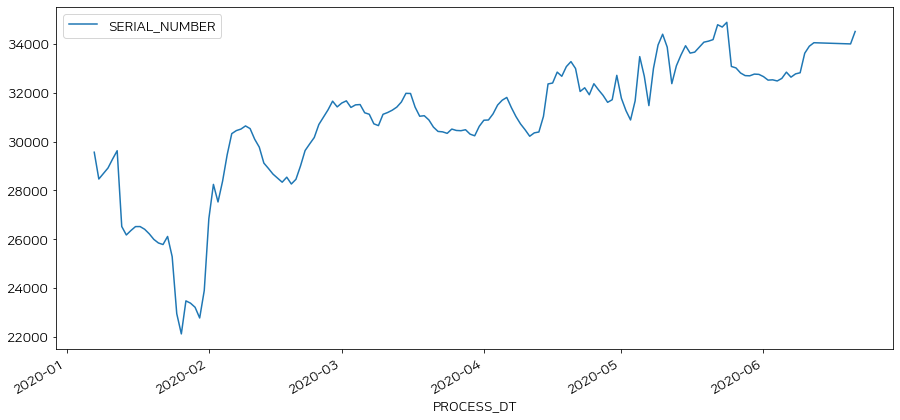

In [12]:
deli.groupby(pd.to_datetime(deli.PROCESS_DT)).agg({"SERIAL_NUMBER": "nunique"}) \
    .rolling(7).mean() \
    .plot(figsize=(15,7))

In [13]:
deli.columns

Index(['SERIAL_NUMBER', 'PROCESS_DT', 'DLVR_REQUST_STTUS_VALUE',
       'DLVR_STORE_INDUTY_NM', 'DLVR_STORE_SIDO', 'DLVR_STORE_SIGUNGU',
       'DLVR_STORE_DONG', 'DLVR_DSTN_SIDO', 'DLVR_DSTN_SIGUNGU',
       'DLVR_DSTN_DONG', 'GOODS_AMOUNT', 'CALL_RLAY_FEE_AMOUNT',
       'SETLE_CARD_CN', 'SETLE_KND_VALUE'],
      dtype='object')

In [14]:
start_dt = datetime.datetime.strptime('2020-03-22', "%Y-%m-%d") # 사회적 거리두기 
end_dt = datetime.datetime.strptime('2020-05-06', "%Y-%m-%d") # 생활적 거리두기
covid_st_dt = datetime.datetime.strptime('2020-02-18', "%Y-%m-%d") # 대구 첫 확진사례
mask_st_dt = datetime.datetime.strptime('2020-03-09', "%Y-%m-%d") # 마스크 5부제 시행
mask_mid_dt = datetime.datetime.strptime('2020-04-27', "%Y-%m-%d") # 마스크 3개까지 확대
mask_end_dt = datetime.datetime.strptime('2020-04-27', "%Y-%m-%d") # 마스크 5부제 폐지

In [15]:
deli.groupby(pd.to_datetime(deli.PROCESS_DT)).agg({"SERIAL_NUMBER": "nunique"}) \
    .rolling(7).mean() \
    .describe()

,SERIAL_NUMBER
count,159.00
mean,30679.84
std,2667.41
min,22119.43
25%,29700.79
50%,31131.86
75%,32610.93
max,34882.14


In [16]:
covid_time = pd.read_csv("./KT_data/Time.csv")
covid_time.date = covid_time.date.astype("datetime64")
covid_time.set_index('date', inplace = True)

In [30]:
deli_daily = deli.groupby(pd.to_datetime(deli.PROCESS_DT)).agg({"SERIAL_NUMBER": "nunique"}) \
                                   .rolling(14).mean() 

In [31]:
text_loc = deli_daily.mean()

In [35]:
covid_time.confirmed.diff()

date
2020-01-20     nan
2020-01-21    0.00
2020-01-22    0.00
2020-01-23    0.00
2020-01-24    1.00
              ... 
2020-06-26   39.00
2020-06-27   51.00
2020-06-28   62.00
2020-06-29   42.00
2020-06-30   43.00
Name: confirmed, Length: 163, dtype: float64

Text(2020-05-06 00:00:00, SERIAL_NUMBER   30356.17
dtype: float64, '생활적 거리두기 전환\n')

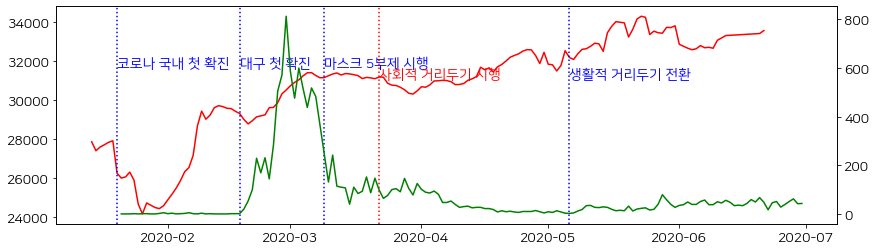

In [36]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

line1 = ax1.plot(deli_daily.index , deli_daily, linestyle = '-', color = 'r') 
line2 = ax2.plot(covid_time.index , covid_time.confirmed.diff() , linestyle = '-', color = 'g')

# 코로나 첫 환자
ax1.axvline(x=covid_time.index.min(), color='b', linestyle=':')
ax1.text(covid_time.index.min(), text_loc + 300, '코로나 국내 첫 확진\n', horizontalalignment='left', color='b')

# 마스크 5부제
ax1.axvline(x=mask_st_dt, color='b', linestyle=':')
ax1.text(mask_st_dt, text_loc + 300, '마스크 5부제 시행\n', horizontalalignment='left', color='b')

# 대구 첫 확진
ax1.axvline(x=covid_st_dt, color='b', linestyle=':')
ax1.text(covid_st_dt, text_loc + 300, '대구 첫 확진\n', horizontalalignment='left', color='b')

# 사회적 거리두기
ax1.axvline(x=start_dt, color='r', linestyle=':')
ax1.text(start_dt, text_loc - 300, '사회적 거리두기 시행\n', horizontalalignment='left', color='r')

# 생활적 거리두기 
ax1.axvline(x=end_dt, color='b', linestyle=':')
ax1.text(end_dt, text_loc - 300, '생활적 거리두기 전환\n', horizontalalignment='left', color='b')

In [40]:
deli.DLVR_STORE_SIDO.unique()

array(['경상남도', '경기도', '서울특별시', '전라남도', '대구광역시', '충청남도', '제주특별자치도', '전라북도',
       '경상북도', '인천광역시', '대전광역시', '부산광역시', '충청북도', '광주광역시', '강원도'],
      dtype=object)

In [43]:
# 대구광역시 확진자와 배달 주문량 비교 
deli.query("DLVR_STORE_SIDO == '대구광역시'").head()

,SERIAL_NUMBER,PROCESS_DT,DLVR_REQUST_STTUS_VALUE,DLVR_STORE_INDUTY_NM,DLVR_STORE_SIDO,DLVR_STORE_SIGUNGU,DLVR_STORE_DONG,DLVR_DSTN_SIDO,DLVR_DSTN_SIGUNGU,DLVR_DSTN_DONG,GOODS_AMOUNT,CALL_RLAY_FEE_AMOUNT,SETLE_CARD_CN,SETLE_KND_VALUE
14,4578003,2020-01-01,1,치킨,대구광역시,수성구,두산동,대구광역시,수성구,지산동,18000,300,승인:롯데카드사,1
61,4578058,2020-01-01,1,분식,대구광역시,수성구,황금동,대구광역시,수성구,두산동,13000,300,NaN,3
172,4578190,2020-01-01,1,분식,대구광역시,수성구,지산동,대구광역시,수성구,지산동,16000,300,NaN,2
176,4578194,2020-01-01,1,분식,대구광역시,수성구,지산동,대구광역시,수성구,범물동,23500,300,NaN,2
255,4578282,2020-01-01,1,분식,대구광역시,수성구,지산동,대구광역시,수성구,황금동,26000,300,NaN,2


In [85]:
dg_deli_daily = deli.query("DLVR_STORE_SIDO == '대구광역시'").groupby(pd.to_datetime(deli.PROCESS_DT)).agg({"SERIAL_NUMBER": "nunique"}) \
                                   .rolling(7).mean() 

In [57]:
covid_region = pd.read_csv("./KT_data/TimeProvince.csv", dtype = dict(zip(pd.read_csv("./KT_data/TimeProvince.csv").columns, ['object']*3 + ['int']*3)))

In [74]:
covid_region.time.unique()

array(['16', '0'], dtype=object)

In [75]:
covid_region.query("province == '대구'")

,date,time,province,confirmed,released,deceased
2,2020-01-20,16,대구,0,0,0
19,2020-01-21,16,대구,0,0,0
36,2020-01-22,16,대구,0,0,0
53,2020-01-23,16,대구,0,0,0
70,2020-01-24,16,대구,0,0,0
...,...,...,...,...,...,...
2688,2020-06-26,0,대구,6903,6695,189
2705,2020-06-27,0,대구,6904,6700,189
2722,2020-06-28,0,대구,6904,6700,189
2739,2020-06-29,0,대구,6906,6700,189


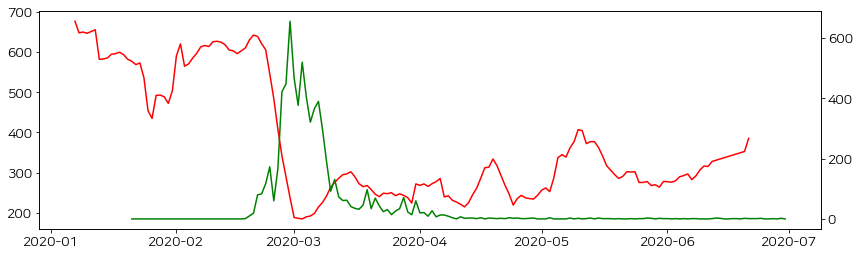

In [95]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

line1 = ax1.plot(dg_deli_daily.index , dg_deli_daily, linestyle = '-', color = 'r') 
line2 = ax2.plot(pd.to_datetime(covid_region.query("province == '대구'").date) \
                 , covid_region.query("province == '대구'").confirmed.diff() \
                 , linestyle = '-', color = 'g')

### 의미는 없겠지만 배달품목에 대한 추이조사

In [116]:
deli.groupby(['PROCESS_DT', 'DLVR_STORE_INDUTY_NM'], as_index = False) \
    .agg({'SERIAL_NUMBER' : 'nunique'}) \
    .pivot(index = 'PROCESS_DT' , columns = 'DLVR_STORE_INDUTY_NM', values = 'SERIAL_NUMBER') \
    .fillna(0) \
    .rolling(7).mean() \
    .iplot()

In [134]:
deli.query("DLVR_STORE_SIDO == '대구광역시'") \
    .groupby(['PROCESS_DT', 'DLVR_STORE_INDUTY_NM'], as_index = False) \
    .agg({'SERIAL_NUMBER' : 'nunique'}) \
    .pivot_table(index = 'PROCESS_DT' , columns = 'DLVR_STORE_INDUTY_NM', values = 'SERIAL_NUMBER') \
    .fillna(0) \
    .rolling(7).mean() \
    .iplot()

In [118]:
deli.query("DLVR_STORE_SIDO == '서울특별시'") \
    .groupby(['PROCESS_DT', 'DLVR_STORE_INDUTY_NM'], as_index = False) \
    .agg({'SERIAL_NUMBER' : 'nunique'}) \
    .pivot(index = 'PROCESS_DT' , columns = 'DLVR_STORE_INDUTY_NM', values = 'SERIAL_NUMBER') \
    .fillna(0) \
    .rolling(7).mean() \
    .iplot()

#### 카페/디저트 주문량 급증?? -> 데이터 오류인 것으로 보임

#### 지역별 차이 존재하는지 확인필요 

In [121]:
deli.head()

,SERIAL_NUMBER,PROCESS_DT,DLVR_REQUST_STTUS_VALUE,DLVR_STORE_INDUTY_NM,DLVR_STORE_SIDO,DLVR_STORE_SIGUNGU,DLVR_STORE_DONG,DLVR_DSTN_SIDO,DLVR_DSTN_SIGUNGU,DLVR_DSTN_DONG,GOODS_AMOUNT,CALL_RLAY_FEE_AMOUNT,SETLE_CARD_CN,SETLE_KND_VALUE
0,4577985,2020-01-01,1,치킨,경상남도,창원시 마산회원구,합성동,경상남도,창원시 마산회원구,석전동,25000,300,승인:비씨카드사,1
1,4577986,2020-01-01,1,찜탕,경기도,광명시,철산동,서울특별시,금천구,가산동,49000,200,NaN,2
2,4577988,2020-01-01,1,치킨,서울특별시,은평구,갈현동,서울특별시,은평구,갈현동,23000,300,승인:,3
3,4577989,2020-01-01,1,한식,경기도,의정부시,의정부동,경기도,의정부시,의정부동,20000,300,NaN,2
4,4577991,2020-01-01,1,한식,경기도,고양시 덕양구,행신동,경기도,고양시 덕양구,주교동,32000,300,NaN,2


In [123]:
deli.groupby(['PROCESS_DT', 'DLVR_STORE_SIDO'], as_index = False) \
    .agg({'SERIAL_NUMBER' : 'nunique'}) \
    .pivot(index = 'PROCESS_DT' , columns = 'DLVR_STORE_SIDO', values = 'SERIAL_NUMBER') \
    .fillna(0) \
    .rolling(7).mean() \
    .iplot()

In [129]:
deli.head()

,SERIAL_NUMBER,PROCESS_DT,DLVR_REQUST_STTUS_VALUE,DLVR_STORE_INDUTY_NM,DLVR_STORE_SIDO,DLVR_STORE_SIGUNGU,DLVR_STORE_DONG,DLVR_DSTN_SIDO,DLVR_DSTN_SIGUNGU,DLVR_DSTN_DONG,GOODS_AMOUNT,CALL_RLAY_FEE_AMOUNT,SETLE_CARD_CN,SETLE_KND_VALUE
0,4577985,2020-01-01,1,치킨,경상남도,창원시 마산회원구,합성동,경상남도,창원시 마산회원구,석전동,25000,300,승인:비씨카드사,1
1,4577986,2020-01-01,1,찜탕,경기도,광명시,철산동,서울특별시,금천구,가산동,49000,200,NaN,2
2,4577988,2020-01-01,1,치킨,서울특별시,은평구,갈현동,서울특별시,은평구,갈현동,23000,300,승인:,3
3,4577989,2020-01-01,1,한식,경기도,의정부시,의정부동,경기도,의정부시,의정부동,20000,300,NaN,2
4,4577991,2020-01-01,1,한식,경기도,고양시 덕양구,행신동,경기도,고양시 덕양구,주교동,32000,300,NaN,2


In [135]:
deli.query("DLVR_STORE_SIDO == '대구광역시'") \
    .groupby(['PROCESS_DT', 'DLVR_DSTN_SIGUNGU'], as_index = False) \
    .agg({'SERIAL_NUMBER' : 'nunique'}) \
    .pivot(index = 'PROCESS_DT' , columns = 'DLVR_DSTN_SIGUNGU', values = 'SERIAL_NUMBER') \
    .fillna(0) \
    .rolling(7).mean() \
    .iplot()

In [136]:
deli.query("DLVR_STORE_SIDO == '서울특별시'") \
    .groupby(['PROCESS_DT', 'DLVR_DSTN_SIGUNGU'], as_index = False) \
    .agg({'SERIAL_NUMBER' : 'nunique'}) \
    .pivot(index = 'PROCESS_DT' , columns = 'DLVR_DSTN_SIGUNGU', values = 'SERIAL_NUMBER') \
    .fillna(0) \
    .rolling(7).mean() \
    .iplot()

#### 품목별 소비지수 

In [426]:
index = pd.read_csv("./KT_data/index.csv", dtype = dict(zip(pd.read_csv("./KT_data/index.csv").columns, ['object'] * 7 + ['float'])))

In [160]:
index.head()

,period,catl,catm,age,gender,sido,sigungu,cgi
0,201901,건강/의료용품,건강관리용품,20,F,서울,관악구,115.37
1,201901,건강/의료용품,건강관리용품,20,F,서울,광진구,119.60
2,201901,건강/의료용품,건강관리용품,20,F,서울,도봉구,156.99
3,201901,건강/의료용품,건강관리용품,20,F,서울,동작구,58.34
4,201901,건강/의료용품,건강관리용품,20,F,서울,마포구,145.15


In [159]:
for col in index.columns :
    print(index[col].unique())
    print("\n")

['201901' '201902' '201903' '201904' '201905' '201906' '201907' '201908'
 '201909' '201910' '201911' '201912' '202001' '202002' '202003' '202004'
 '202005']


['건강/의료용품' '식품' '일용품' '화장품']


['건강관리용품' '가공식품' '기호식품' '담배' '빙과류' '빵류' '신선식품' '유제품류' '음료' '제과류' '주류'
 '생활용품' '애완동물용품' '기타화장품' '바디/헤어용품' '뷰티소품' '화장품']


['20' '30' '40' '50' '60' 'all']


['F' 'M' 'all']


['서울']


['관악구' '광진구' '도봉구' '동작구' '마포구' '성북구' '용산구' 'all' '강동구' '강서구' '금천구' '동대문구'
 '서대문구' '송파구' '종로구' '양천구' '영등포구' '은평구' '강북구' '구로구' '강남구' '노원구' '서초구' '중랑구'
 '중구' '성동구']


[115.37464197 119.5964542  156.99284736 ...  82.1984016   35.8756
  45.56937694]




In [173]:
index.cgi

0        115.37
1        119.60
2        156.99
3         58.34
4        145.15
          ...  
127520    51.37
127521    62.00
127522    82.20
127523    35.88
127524    45.57
Name: cgi, Length: 127525, dtype: float64

In [430]:
index.period = pd.to_datetime(index.period, format='%Y%m')

In [185]:
index.set_index("period", inplace = True)

In [245]:
df = index.query("age == 'all' and gender == 'all' and sigungu == 'all'")

In [246]:
plt.style.use('seaborn-darkgrid')
# create a color palette
palette = plt.get_cmap('Set1')

In [247]:
df = df.pivot_table(columns = 'catm', values = 'cgi', index = df.index, aggfunc= 'mean')['2020':]

In [250]:
# size, family
print('# 설정되어있는 폰트 사이즈')
print (plt.rcParams['font.size'] ) 
print('# 설정되어있는 폰트 글꼴')
print (plt.rcParams['font.family'] )

# 설정되어있는 폰트 사이즈
13.0
# 설정되어있는 폰트 글꼴
['sans-serif']


In [255]:
plt.rcParams['font.size'] = 11

In [256]:
plt.rcParams["font.family"] = 'NanumSquare'

In [ ]:
palette()

In [266]:
index

,catl,catm,age,gender,sido,sigungu,cgi
period,,,,,,,
2019-01-01,건강/의료용품,건강관리용품,20,F,서울,관악구,115.37
2019-01-01,건강/의료용품,건강관리용품,20,F,서울,광진구,119.60
2019-01-01,건강/의료용품,건강관리용품,20,F,서울,도봉구,156.99
2019-01-01,건강/의료용품,건강관리용품,20,F,서울,동작구,58.34
2019-01-01,건강/의료용품,건강관리용품,20,F,서울,마포구,145.15
...,...,...,...,...,...,...,...
2020-05-01,화장품,화장품,all,all,서울,강서구,51.37
2020-05-01,화장품,화장품,all,all,서울,관악구,62.00
2020-05-01,화장품,화장품,all,all,서울,금천구,82.20


In [275]:
mapping = dict(zip(index.age.unique(), ['2030'] * 2 + ['4050'] * 2 + ['60'] + ['all']))

In [277]:
index['age'] = index['age'].apply(lambda x: mapping[x])

In [319]:
index.catm.unique()

array(['건강관리용품', '가공식품', '기호식품', '담배', '빙과류', '빵류', '신선식품', '유제품류', '음료',
       '제과류', '주류', '생활용품', '애완동물용품', '기타화장품', '바디/헤어용품', '뷰티소품', '화장품'],
      dtype=object)

In [337]:
index.reset_index(inplace = True)

In [343]:
increase_cgi = index.query("cgi > 100 and gender == 'all' and sigungu == 'all' and period >= '2020'")\
               .groupby(['catl','catm'])\
               .agg({'period' : 'nunique'})\
               .sort_values("period", ascending = False)

In [346]:
increase_cgi

period
catl    catm           
식품      담배            5
        신선식품          5
        유제품류          5
        주류            5
        가공식품          4
건강/의료용품 건강관리용품        3
식품      빵류            3
        음료            2
        제과류           2
일용품     생활용품          2
화장품     화장품           2
식품      기호식품          1
화장품     바디/헤어용품       1
        뷰티소품          1

In [349]:
incre_cgi = index.query("cgi > 100 and gender == 'all' and sigungu == 'all' and period >= '2020-03'")\
                 .groupby(['catl','catm'])\
                 .agg({'period' : 'nunique'})\
                 .sort_values("period", ascending = False)\
                 .reset_index().catm.unique()

In [365]:
cgi = index.query("cgi > 120 and period >= '2020-03' and catm not in @incre_cgi")\
           .iloc[:,[-2,-5,-4, 2, -1, 0]]\
           .sort_values("sigungu")

In [371]:
cgi.cgi.describe()

count    660.00
mean     198.36
std      136.72
min      120.01
25%      133.47
50%      155.47
75%      198.07
max     1937.05
Name: cgi, dtype: float64

In [370]:
cgi.catm.value_counts()

애완동물용품     166
뷰티소품       133
제과류        125
빙과류         89
기호식품        67
화장품         44
바디/헤어용품     34
기타화장품        2
Name: catm, dtype: int64

## paired two-sample t-test

In [373]:
index.cgi.describe()

count   127525.00
mean        98.50
std         74.43
min          0.00
25%         75.65
50%         92.49
75%        109.68
max       9885.60
Name: cgi, dtype: float64

In [524]:
cat_out_lier = index.groupby(['catm','sigungu']).agg({"cgi": ['mean', 'std']})

In [525]:
cat_out_lier.columns = ['mean', 'std']

In [526]:
cat_out_lier['outline'] = cat_out_lier['mean'] + cat_out_lier['std'] * 3

In [527]:
cat_out_lier

mean    std  outline
catm sigungu                       
가공식품 all     100.80  13.73   142.00
     강남구      96.54  13.24   136.27
     강동구      93.15  17.43   145.45
     강북구      94.79  10.17   125.29
     강서구      97.23  19.31   155.15
...             ...    ...      ...
화장품  용산구      76.63  35.49   183.11
     은평구      74.05  28.80   160.44
     종로구      82.61  40.99   205.59
     중구      178.80 457.22  1550.47
     중랑구     240.72 811.92  2676.47

[419 rows x 3 columns]

In [530]:
over_otlr = \
index.merge(cat_out_lier, how='left', on = ['catm', 'sigungu'])\
     .query("cgi >= outline and period >= '2020-03' and catm not in @incre_cgi")\

In [534]:
over_otlr.catm.value_counts()

제과류        23
기호식품       13
뷰티소품       10
화장품         5
애완동물용품      4
바디/헤어용품     3
Name: catm, dtype: int64

In [539]:
over_otlr.head()

,period,catl,catm,age,gender,sido,sigungu,cgi,mean,std,outline
105194,2020-03-01,식품,기호식품,20,M,서울,동작구,148.70,45.60,29.33,133.59
105319,2020-03-01,식품,제과류,20,F,서울,강북구,210.87,88.81,19.64,147.72
105419,2020-03-01,화장품,뷰티소품,20,M,서울,강동구,348.48,120.11,61.91,305.83
105612,2020-03-01,식품,제과류,20,M,서울,강북구,162.27,88.81,19.64,147.72
105622,2020-03-01,식품,제과류,20,all,서울,강북구,197.89,88.81,19.64,147.72


In [412]:
over_otlr.catm.value_counts()

제과류        31
애완동물용품     18
뷰티소품        7
기호식품        6
바디/헤어용품     3
빙과류         2
화장품         2
Name: catm, dtype: int64

In [415]:
covid_time.confirmed.diff() # 본격적으로 covid 유입: 2월

date
2020-01-20     nan
2020-01-21    0.00
2020-01-22    0.00
2020-01-23    0.00
2020-01-24    1.00
              ... 
2020-06-26   39.00
2020-06-27   51.00
2020-06-28   62.00
2020-06-29   42.00
2020-06-30   43.00
Name: confirmed, Length: 163, dtype: float64

In [419]:
import scipy as sp

In [560]:
index.catm.unique().shape

(17,)

In [466]:
index.age.unique()

array(['20', '30', '40', '50', '60', 'all'], dtype=object)

In [554]:
for category in index.catm.unique():
    for sigungu in index.sigungu.unique():
        df = index.query("age != 'all' and gender != 'all' and sigungu == @sigungu")
        x1 = df.query("catm == @category and period <= '2019-05' and period >= '2019-03'").cgi.values
        x2 = df.query("catm == @category and period >= '2020-03'").cgi.values
#         print(x1.shape , x2.shape)
        t_result = sp.stats.ttest_ind(x1, x2, equal_var= 'False')
        if t_result.pvalue < 0.1 and x1.mean() < x2.mean():
            print(sigungu, t_result.pvalue)
            print('x1: ', x1.mean(), '\n',
                  'x2: ', x2.mean(), '\n',
                  category)

도봉구 0.041397452006875154
x1:  144.43954689764703 
 x2:  163.5594880044109 
 담배
동작구 0.022359279768962095
x1:  159.66777882335145 
 x2:  195.03393517957565 
 담배
강동구 0.007587558382341739
x1:  154.00225486908636 
 x2:  177.27874631954785 
 담배
서대문구 0.0040415496783150215
x1:  145.68025922688508 
 x2:  180.57676197865416 
 담배
양천구 0.034038837741184824
x1:  143.56965400813536 
 x2:  163.46381360891687 
 담배
구로구 0.017316689611953522
x1:  164.8953678687132 
 x2:  199.00354181663468 
 담배
중랑구 0.06314751733387793
x1:  170.9386474930633 
 x2:  198.6255965641076 
 담배
도봉구 0.012537501879224696
x1:  74.78334887622033 
 x2:  96.46481773337396 
 빙과류
영등포구 0.009523552290959452
x1:  96.01049754329463 
 x2:  110.0245077229052 
 빙과류
마포구 0.026611913128321
x1:  108.17162078798239 
 x2:  119.09143113499678 
 주류
용산구 0.0001504598132041245
x1:  98.47365819182217 
 x2:  116.23776775375342 
 주류
영등포구 0.01716739320841571
x1:  97.85490290606079 
 x2:  113.22417102942792 
 주류
강남구 1.9454572523683814e-08
x1:  97.4314166677429

In [564]:
i = 0
for category in index.catm.unique():
    df = index
    x1 = df.query("catm == @category and period <= '2019-05' and period >= '2019-02'").cgi.values
    x2 = df.query("catm == @category and period >= '2020-02'").cgi.values
#         print(x1.shape , x2.shape)
    t_result = sp.stats.ttest_ind(x1, x2, equal_var= 'False')
    if t_result.pvalue < 0.05 and x1.mean() > x2.mean():
        print(category, t_result.pvalue)
        print('x1: ', x1.mean(), '\n',
              'x2: ', x2.mean(), '\n')
        i += 1 
print(i)

건강관리용품 6.756936574549829e-08
x1:  102.97167773687096 
 x2:  94.46573089975715 

가공식품 2.248231413091222e-31
x1:  95.1440967864835 
 x2:  86.0403027478644 

기호식품 5.643877549815728e-86
x1:  94.82956142915228 
 x2:  69.9854225990379 

빙과류 6.70704990250339e-19
x1:  87.95201373095536 
 x2:  79.1820154835594 

빵류 5.519664499089546e-200
x1:  101.07551480804287 
 x2:  77.04168439642734 

신선식품 2.0990550423743245e-34
x1:  97.54790051158643 
 x2:  86.39279833179552 

유제품류 1.699490013880531e-16
x1:  98.31693970413137 
 x2:  92.166056949596 

음료 1.7859361094690305e-61
x1:  96.91188416505018 
 x2:  82.57257261077291 

제과류 5.853404657715923e-20
x1:  103.15092170447849 
 x2:  90.95970922415499 

생활용품 3.6941322737107574e-29
x1:  98.06855974486236 
 x2:  78.06358974339783 

애완동물용품 4.253147705068041e-09
x1:  98.71686433558382 
 x2:  84.50421820991716 

기타화장품 1.878436674427445e-13
x1:  111.56630763856003 
 x2:  48.37116435639418 

바디/헤어용품 1.1681058344569213e-40
x1:  85.76473030600003 
 x2:  64.150342324186

In [ ]:
i = 0
for category in index.catm.unique():
    for gender in index.gender.unique():
        for age in index.age.unique():
    df = index.query("age != 'all' and gender != 'all' and sigungu == @sigungu")
    x1 = df.query("catm == @category and period <= '2019-05' and period >= '2019-02'").cgi.values
    x2 = df.query("catm == @category and period >= '2020-02'").cgi.values
#         print(x1.shape , x2.shape)
    t_result = sp.stats.ttest_ind(x1, x2, equal_var= 'False')
    if t_result.pvalue < 0.05 and x1.mean() > x2.mean():
        print(category, t_result.pvalue)
        print('x1: ', x1.mean(), '\n',
              'x2: ', x2.mean(), '\n')
        i += 1 
print(i)

In [568]:
index.set_index('period', inplace = True)

In [570]:
index.age.unique()

array(['20', '30', '40', '50', '60', 'all'], dtype=object)

In [571]:
index.gender.unique()

array(['F', 'M', 'all'], dtype=object)

In [576]:
index.pivot_table(columns = 'catm', values = 'cgi', index = df.index, aggfunc= 'mean')['2019':] \
     .plot()

ValueError: Grouper and axis must be same length

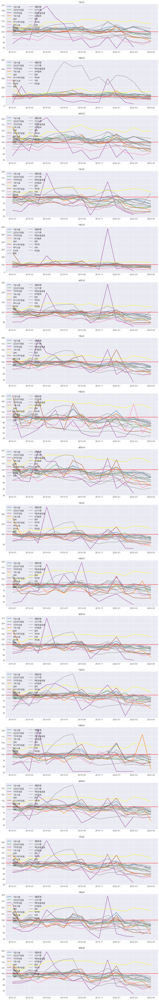

In [574]:
f, axes = plt.subplots(18, 1)
f.set_figheight(100)
f.set_figwidth(15)
i = 0
sigungu = 'all'
for age in index.age.unique():
    for gender in index.gender.unique():
        df = index.query("gender == @gender and age == @age and sigungu == @sigungu")
        df = df.pivot_table(columns = 'catm', values = 'cgi', index = df.index, aggfunc= 'mean')['2019':]
#         print(df)
        num=0
        for column in df:
            num+=1
            axes[i].plot(df.index, df[column], marker='', color=palette(num), linewidth=2, alpha=0.9, label=column)
        # Add legend
        axes[i].legend(loc=2, ncol=2)
        axes[i].axhline(y = 100, color='r')
        # Add titles
        axes[i].title.set_text(gender + "&" + age)
#         axes[i].xlabel("Time")
#         axes[i].ylabel("Index")
        i += 1 

plt.show()

###### 카테고리성장지수 (2018년 월평균 대비 매출 성장 비율, 100을 기준으로 이상이면 매출 상승, 이하면 하락)

In [314]:
print(len(index.sigungu.unique()))
print(len(index.age.unique()))
print(len(index.gender.unique()))

26
4
3


78


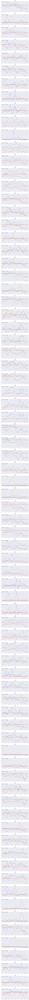

In [318]:
f, axes = plt.subplots(78, 1)
f.set_figheight(30*18)
f.set_figwidth(15)
i = 0
# sigungu = 'all'
age = '2030'
for sigungu in index.sigungu.unique():
#     for age in index.age.unique():
    for gender in index.gender.unique():
        df = index.query("gender == @gender and age == @age and sigungu == @sigungu")
        df = df.pivot_table(columns = 'catl', values = 'cgi', index = df.index, aggfunc= 'mean')['2019':]
#         print(df)
        num=0
        for column in df:
            num+=1
            axes[i].plot(df.index, df[column], marker='', color=palette(num), linewidth=2, alpha=0.9, label=column)
        # Add legend
        axes[i].legend(loc=2, ncol=2)
        axes[i].axhline(y = 100, color='r')
        # Add titles
        axes[i].title.set_text(sigungu+"\n("+ gender + "&" + age +")")
#         axes[i].xlabel("Time")
#         axes[i].ylabel("Index")
        i += 1 
print(i)
plt.show()